In [1]:
pip install control

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.1.2 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import control as ct

In [3]:
import numpy as np
import scipy as sp
from scipy.interpolate import pade
import scipy.signal as signal
import matplotlib.pyplot as plt

## Control Engineering

### Contents

- Introduction
- Useful Libraries
    - Numpy, Matplotlib
    - Scipy (especially Scipy.signal)
    - Python control system library (Control)
- Python Examples

### Introduction : Control System

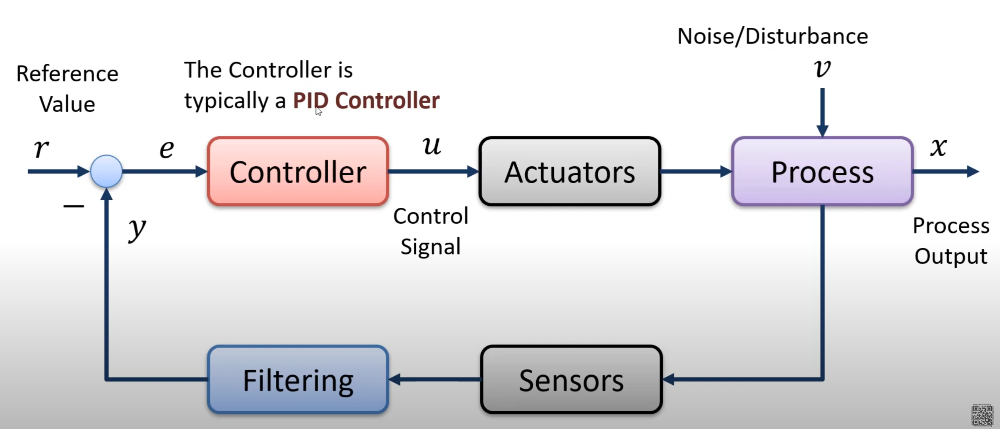

1. r - reference value, SP( Set-point), SV(Set value)
2. y -  measurement value (MV), Process value (PV)
3. e -  error between the refernece value and the measurement value (e = r-y)
4. v - Disturbances, makes it more complicated to control the process
5. u - Control signal from the controller

### The PID Algorithm

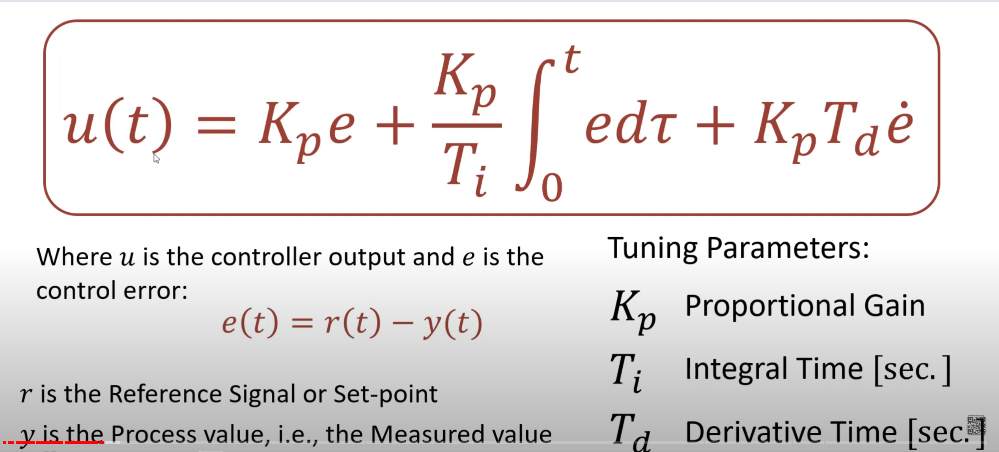

This PID controller is the most used controller in the control system today due to followwing reasons:
1. Easy to use
2. Easy to implement
3. Less tuning parameters, three in total ( Kp, Ti and Td)

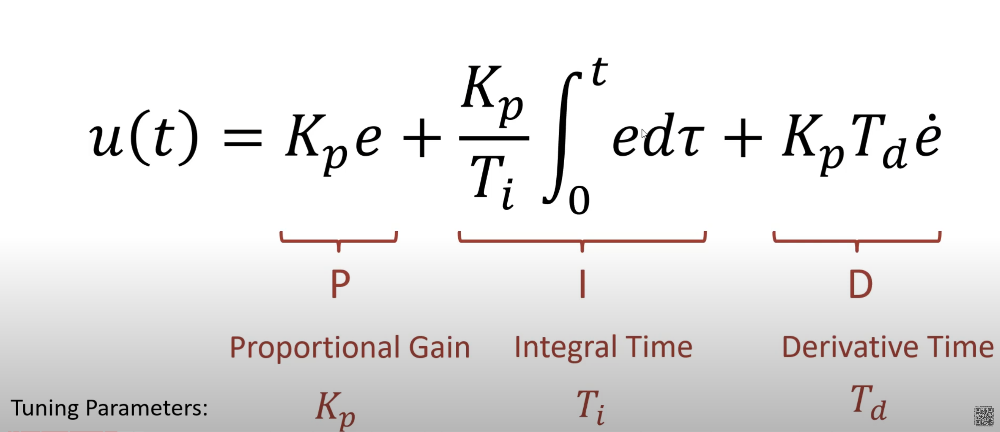

### Python examples

The purpose of the control system is to Control dyanamic system, e.g., an industrial process, an airplane, a self-driven car, etc.

Typically, we start with a Mathematical model of such a Dynamic System.

The mathematical model of this sytem can be
- A Differential Equation
- A Transfer Function
- A State Space model

The Mathematical model is created to act as a simulator of the system



#### First Order Dynamic System

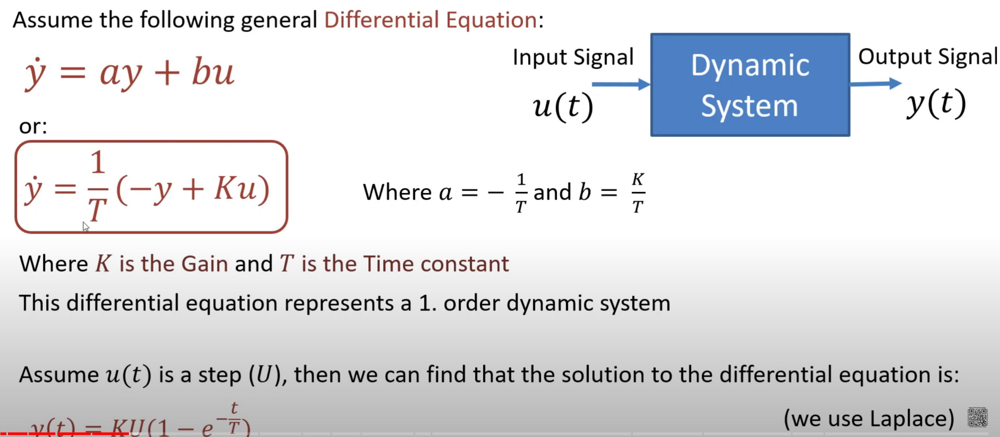

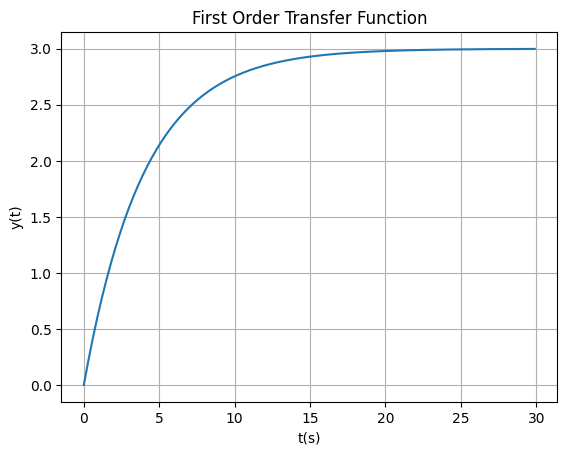

In [4]:
# Let's code the above eqaution

T = 4
K = 3
U = 1

start = 0
stop  = 30
step  = 0.1

t = np.arange(start, stop, step)

y = K * U *(1-np.exp(-t/T))

plt.plot(t, y)
plt.title("First Order Transfer Function")
plt.xlabel("t(s)")
plt.ylabel('y(t)')
plt.grid()
plt.show()

**Comments**
- The above method is one of the method to solve the differential equation.
- This will work for the simple system. For complicated systems it may be difficult to solve the differential equation by hand.
- We can use one of the built in fucntion ODE solvers in Python.
- We can make discrete version of the system.
- we can convert the differential eqaution(s) to transfer function(s).

Let's see some examples to understand this better.

#### 1 . Solving the DE using ODE solver

[[0.        ]
 [0.66359764]
 [1.180408  ]
 [1.58290034]
 [1.89636168]
 [2.14048562]
 [2.33060954]
 [2.4786782 ]
 [2.59399418]
 [2.68380236]
 [2.75374502]
 [2.80821642]
 [2.8506388 ]
 [2.88367738]
 [2.90940785]
 [2.92944676]
 [2.94505308]
 [2.95720729]
 [2.96667301]
 [2.97404491]
 [2.97978616]
 [2.98425744]
 [2.98773968]
 [2.99045165]
 [2.99256374]
 [2.99420864]]


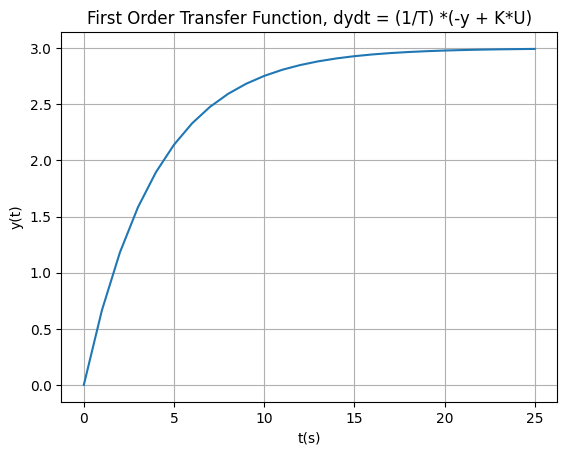

In [5]:
from scipy.integrate import odeint

# Initialization
K = 3
T = 4
U = 1

start = 0
stop  = 25
step  = 1

y0 = 0

t = np.arange(start, stop + 1, step)

# Function that returns dx/dt

def system1order(y,t , K , T, U):
  dydt = (1/T) * (-y + K * U)
  return dydt

# Solve ode
x = odeint(system1order, y0, t, args=(K, T, U))
print(x)

# Plot the results
plt.plot(t, x)
plt.title("First Order Transfer Function, dydt = (1/T) *(-y + K*U)")
plt.xlabel("t(s)")
plt.ylabel('y(t)')
plt.grid()
plt.show()

#### 2. Using Discretization to solve the DE

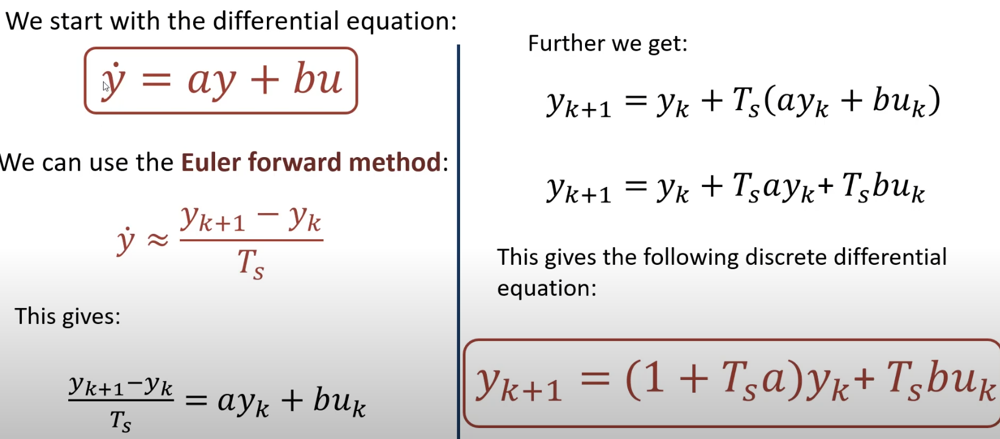

[0, 0.07500000000000001, 0.148125, 0.21942187500000002, 0.28893632812500003, 0.35671291992187504, 0.42279509692382816, 0.48722521950073244, 0.5500445890132142, 0.6112934742878837, 0.6710111374306866, 0.7292358589949195, 0.7860049625200465, 0.8413548384570453, 0.8953209674956191, 0.9479379433082287, 0.999239494725523, 1.0492585073573848, 1.0980270446734501, 1.1455763685566138, 1.1919369593426985, 1.2371385353591309, 1.2812100719751525, 1.3241798201757735, 1.366075324671379, 1.4069234415545946, 1.4467503555157297, 1.4855815966278365, 1.5234420567121405, 1.5603560052943368, 1.5963471051619784, 1.6314384275329288, 1.6656524668446056, 1.6990111551734903, 1.731535876294153, 1.7632474793867992, 1.794166292402129, 1.8243121350920757, 1.8537043317147737, 1.8823617234219043, 1.9103026803363565, 1.9375451133279475, 1.9641064854947488, 1.99000382335738, 2.0152537277734455, 2.0398723845791094, 2.063875574964632, 2.0872786855905163, 2.1100967184507535, 2.1323443004894846, 2.1540356929772475, 2.17518

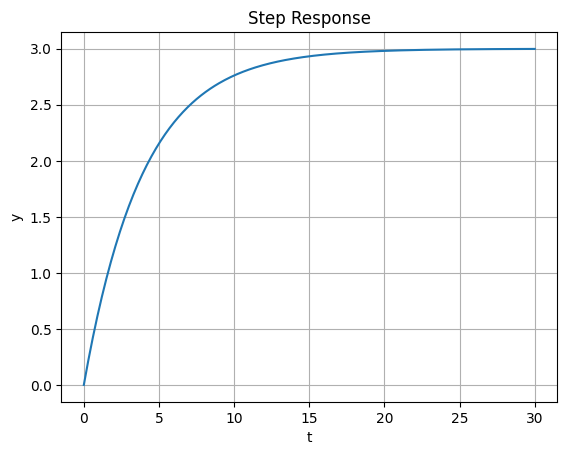

In [6]:
# Model parameters

K = 3
T = 4
a = -1/T
b = K/T

# Simulation Parameters
Ts = 0.1
t_stop = 30
uk = 1 # step response
yk = 0 # Initial value
N = int(t_stop/Ts) # Simulation length
data = []
data.append(yk)

# Simulation
for k in range(N):
  yk1 = (1 + Ts * a) * yk + (Ts * b * uk)
  yk = yk1
  data.append(yk1)

print(data)
# Plot the simulation
t = np.arange(0, t_stop+Ts, Ts)
plt.plot(t, data)
plt.title("Step Response")
plt.xlabel("t")
plt.ylabel('y')
plt.grid()
plt.show()

The code simulates a first-order system with a gain of 3 and a time constant of 4 seconds. The system is subjected to a unit step input.

Here's a breakdown of the first few steps:

**Step 0 (Initialization):**

yk = 0 (Initial output)
uk = 1 (Step input)
yk1 = (1 + 0.1 * -0.25) * 0 + (0.1 * 0.75 * 1) = 0.075
data = [0, 0.075]

**Step 1:**

yk = 0.075 (Previous output)
uk = 1
yk1 = (1 + 0.1 * -0.25) * 0.075 + (0.1 * 0.75 * 1) = 0.14625
data = [0, 0.075, 0.14625]

**Step 2:**

yk = 0.14625
uk = 1
yk1 = (1 + 0.1 * -0.25) * 0.14625 + (0.1 * 0.75 * 1) = 0.2139375
data = [0, 0.075, 0.14625, 0.2139375]

And so on...

### Transfer Functions

In [7]:
# Define Transfer Function
K = 2
T = 3

num = np.array([K])
den = np.array([T,1])

H = signal.TransferFunction(num,den)
print(H)

TransferFunctionContinuous(
array([0.66666667]),
array([1.        , 0.33333333]),
dt: None
)


In [8]:
# Step Response
t, y = signal.step(H)

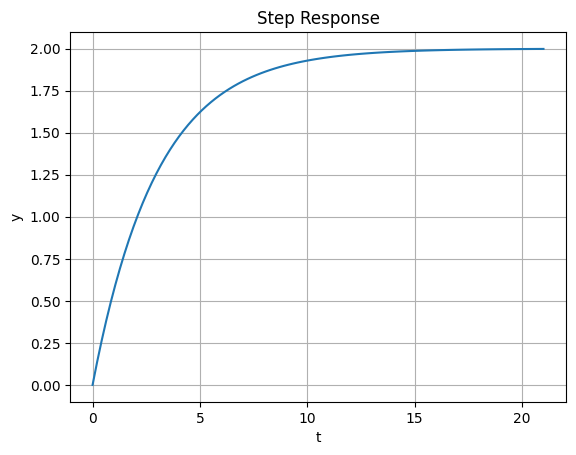

In [9]:
# Plotting
plt.plot(t,y)
plt.title("Step Response")
plt.xlabel("t")
plt.ylabel('y')
plt.grid()
plt.show()

![image.png](attachment:image.png)

In [10]:
# Example 1

num = np.array([2])
den = np.array([3,1])

H = signal.TransferFunction(num,den)

print(H)

TransferFunctionContinuous(
array([0.66666667]),
array([1.        , 0.33333333]),
dt: None
)


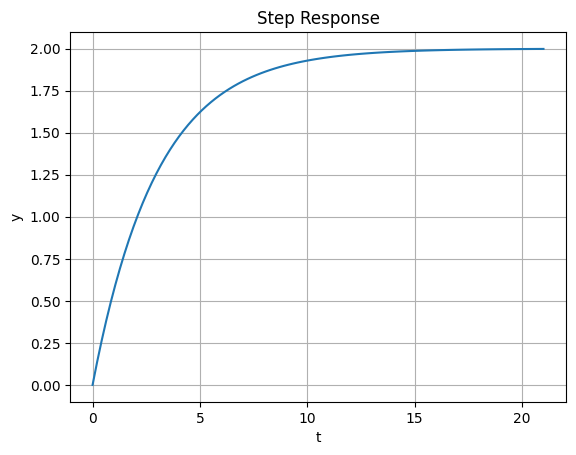

In [11]:
t, y = signal.step(H) # step response
# Plotting
plt.plot(t,y)
plt.title("Step Response")
plt.xlabel("t")
plt.ylabel('y')
plt.grid()
plt.show()

![image.png](attachment:image.png)

In [12]:
# Example 2

num = np.array([6,1])
den = np.array([1,4, 8])

H = signal.TransferFunction(num,den)

print(H)

TransferFunctionContinuous(
array([6., 1.]),
array([1., 4., 8.]),
dt: None
)


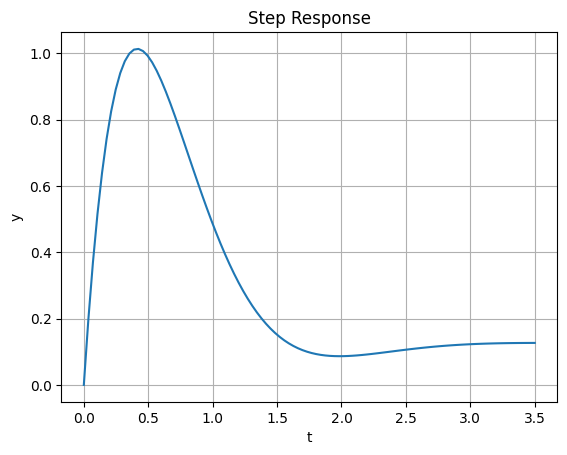

In [13]:
t, y = signal.step(H) # step response
# Plotting
plt.plot(t,y)
plt.title("Step Response")
plt.xlabel("t")
plt.ylabel('y')
plt.grid()
plt.show()

## Types of Transfer functions

- First order Transfer functions
- Integrator
- Time Delay
-  First order Transfer function with Time Delay
- Second order Transfer function

#### First order Transfer Functions

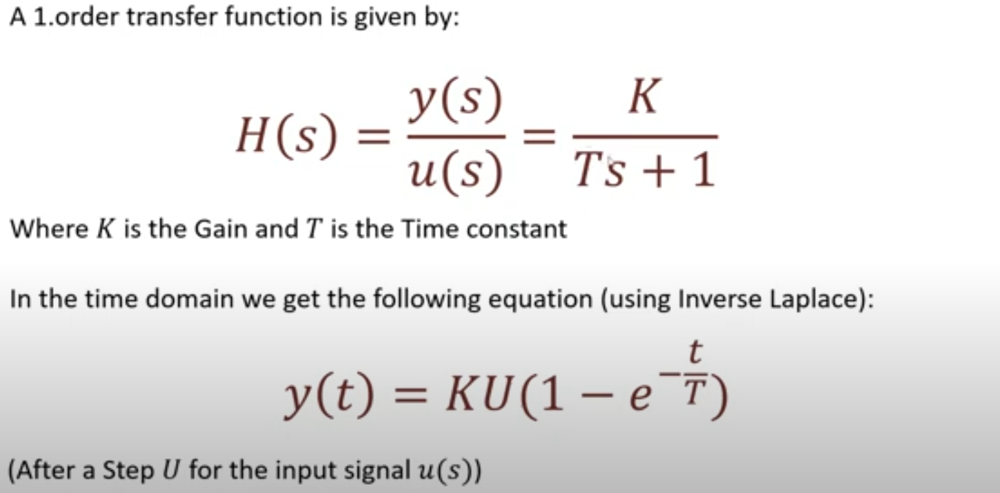

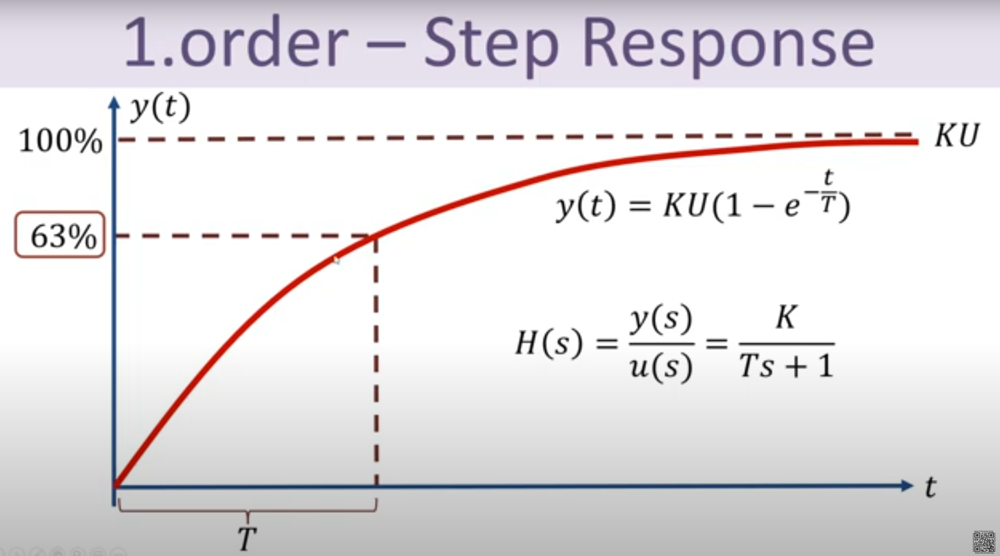

The first image shows a time-domain signal, which represents the variation of a quantity over time.

The second image shows the frequency spectrum of the same signal, obtained using a Fourier transform.
It reveals the different frequency components present in the signal and their respective amplitudes.


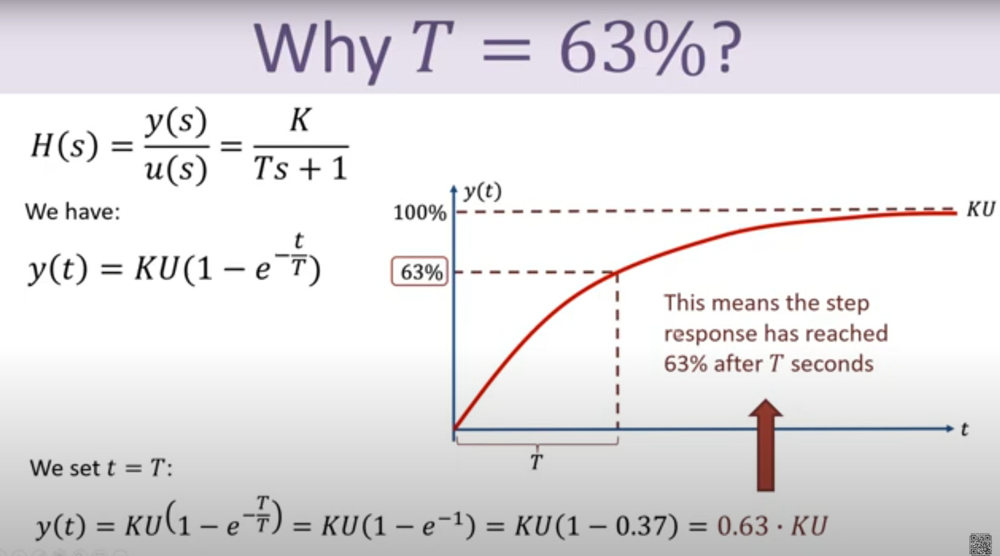

H(s) =  TransferFunctionContinuous(
array([2.]),
array([1. , 0.2]),
dt: None
)
H(s) =  TransferFunctionContinuous(
array([1.]),
array([1. , 0.1]),
dt: None
)
H(s) =  TransferFunctionContinuous(
array([0.66666667]),
array([1.        , 0.06666667]),
dt: None
)
H(s) =  TransferFunctionContinuous(
array([0.33333333]),
array([1.        , 0.03333333]),
dt: None
)
H(s) =  TransferFunctionContinuous(
array([0.2]),
array([1.  , 0.02]),
dt: None
)


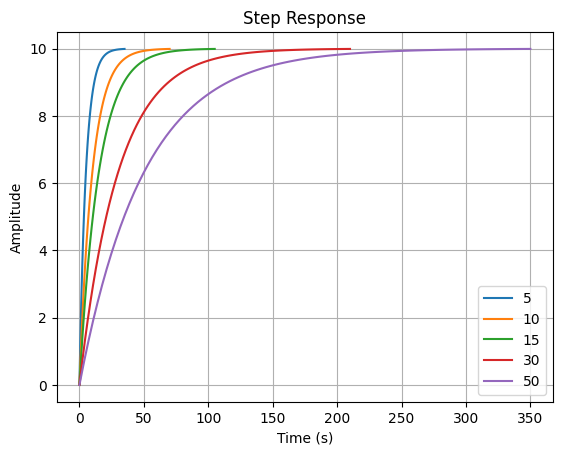

In [14]:
# Implementing different time constants T in a first order transfer function

K = 10
T_array = [5, 10, 15, 30, 50]

start = 0
stop = 200
step = 0.1
t = np.arange(start, stop, step)

for T in T_array:
  # Create Tranfer function
  num = np.array([K])
  den = np.array([T,1])

  H = signal.TransferFunction(num, den)
  print('H(s) = ', H)

  # Step Response
  t, y = signal.step(H)
  plt.plot(t, y)


plt.title('Step Response')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend(T_array)
plt.grid(True)
plt.show()

**Conclusion**
1. Larger T -  Slower System
2. Smaller T -  Faster system

H(s) =  TransferFunctionContinuous(
array([0.1]),
array([1. , 0.1]),
dt: None
)
H(s) =  TransferFunctionContinuous(
array([0.3]),
array([1. , 0.1]),
dt: None
)
H(s) =  TransferFunctionContinuous(
array([0.5]),
array([1. , 0.1]),
dt: None
)
H(s) =  TransferFunctionContinuous(
array([1.]),
array([1. , 0.1]),
dt: None
)


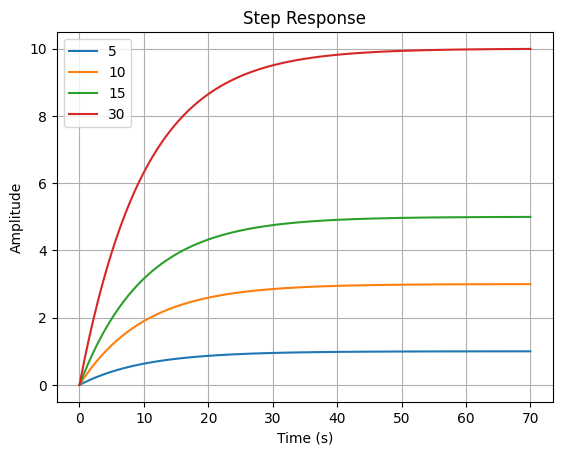

In [15]:
# Changing the gain of the system this time
T = 10
K_array = [1, 3, 5, 10]

start = 0
stop = 200
step = 0.1
t = np.arange(start, stop, step)

for K in K_array:
  # Create Tranfer function
  num = np.array([K])
  den = np.array([T,1])

  H = signal.TransferFunction(num, den)
  print('H(s) = ', H)

  # Step Response
  t, y = signal.step(H)
  plt.plot(t, y)


plt.title('Step Response')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend(T_array)
plt.grid(True)
plt.show()

**Conclusion**
- A higher gain value will amplify the output signal. This translates to a steeper rise in the initial step response and a higher final steady-state value in the plot.
- The time constant T remains constant throughout the loop. This means the basic response shape (settling time) remains similar, but the gain scales the overall output.

#### Integrator

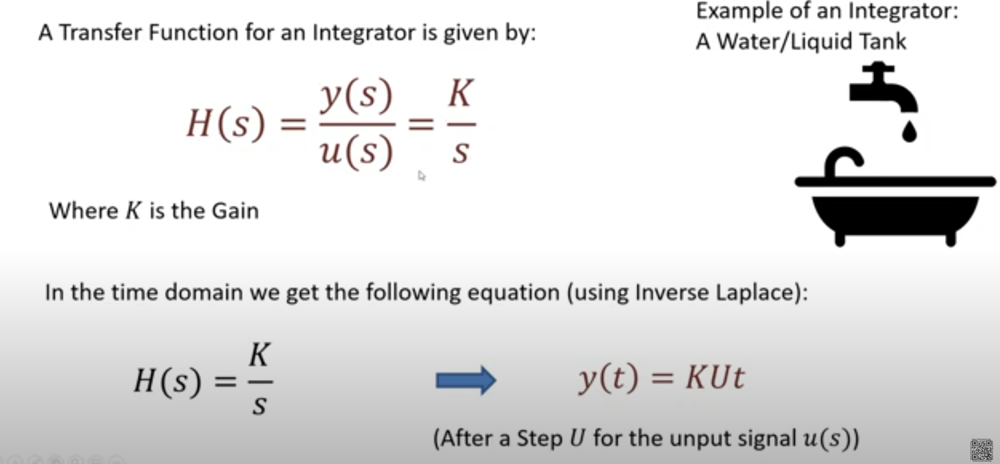

H(s) =  TransferFunctionContinuous(
array([1.]),
array([1., 0.]),
dt: None
)
H(s) =  TransferFunctionContinuous(
array([5.]),
array([1., 0.]),
dt: None
)
H(s) =  TransferFunctionContinuous(
array([10.]),
array([1., 0.]),
dt: None
)


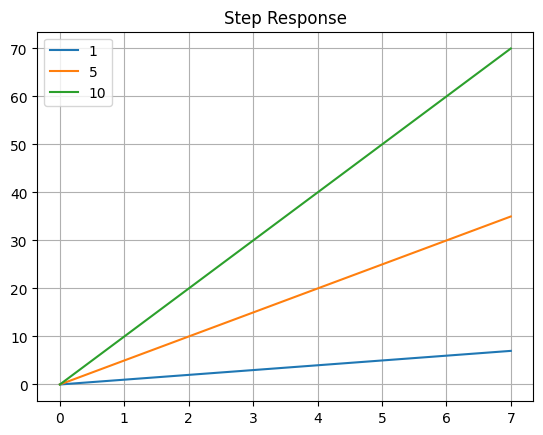

In [16]:
K_array = [1,5,10]

for K in K_array:
  num = np.array([K])
  den = np.array([1,0])

  H = signal.TransferFunction(num, den)
  print("H(s) = ", H)

  t, y = signal.step(H)
  plt.plot(t, y)
plt.grid()
plt.title('Step Response')
plt.legend(K_array)
plt.show()

#### Time Delay

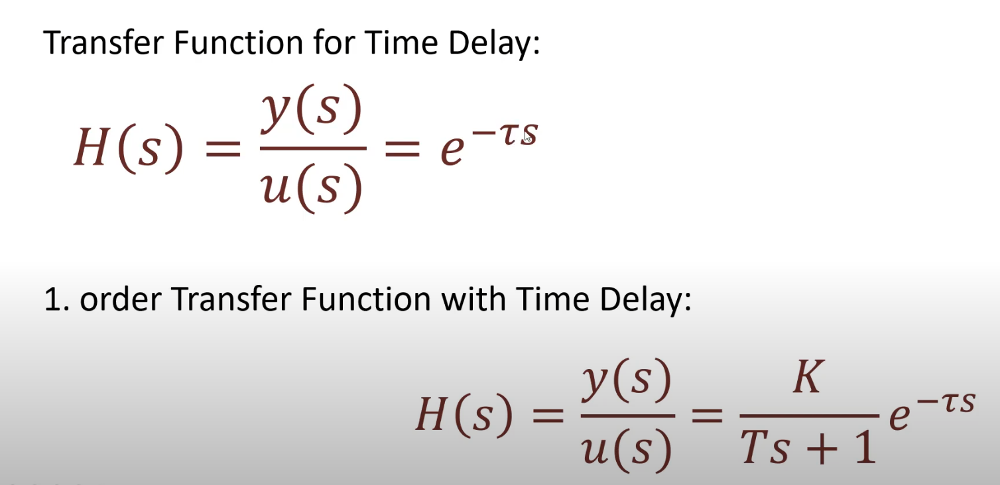

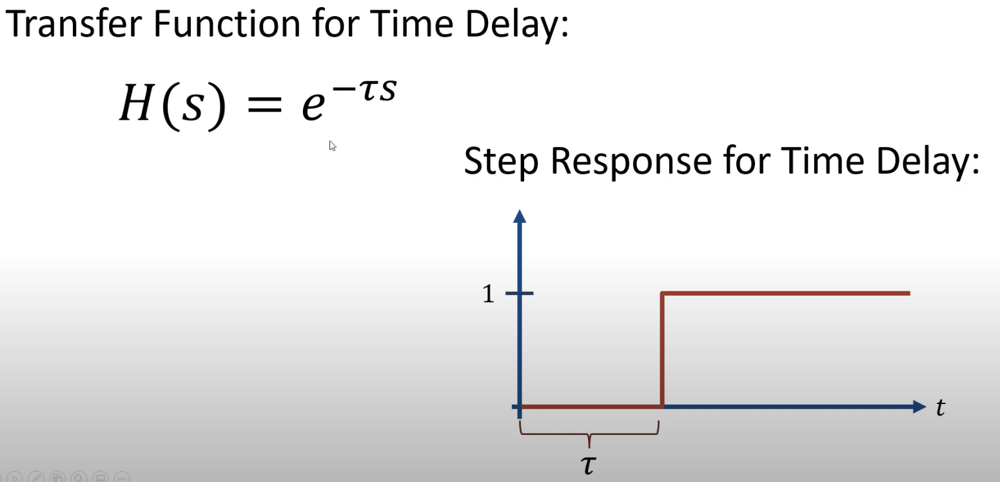

In order to implement such tranfer functions in coding languages, we have to implement some approximations first.

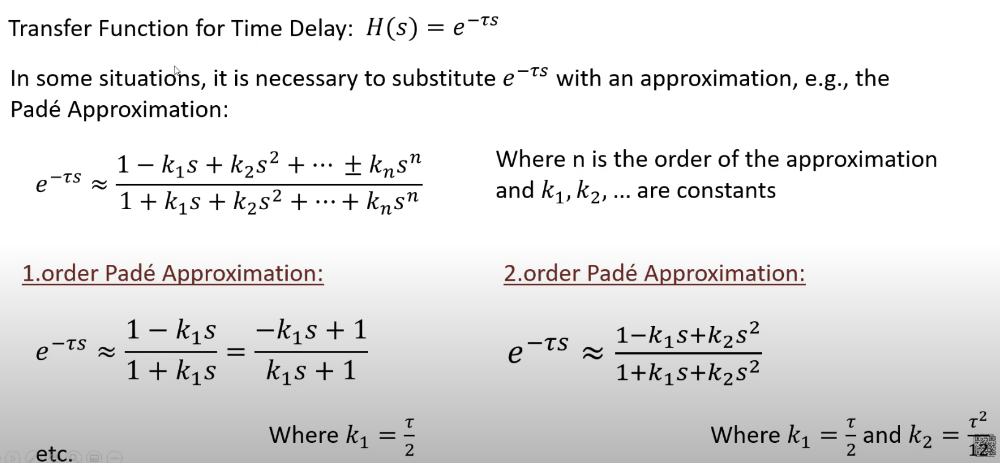

Let's try Pade approximation
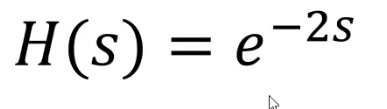

Hpade =  <TransferFunction>: sys[0]
Inputs (1): ['u[0]']
Outputs (1): ['y[0]']


-s^5 + 15 s^4 - 105 s^3 + 420 s^2 - 945 s + 945
-----------------------------------------------
s^5 + 15 s^4 + 105 s^3 + 420 s^2 + 945 s + 945



Text(0.5, 0, 'Time')

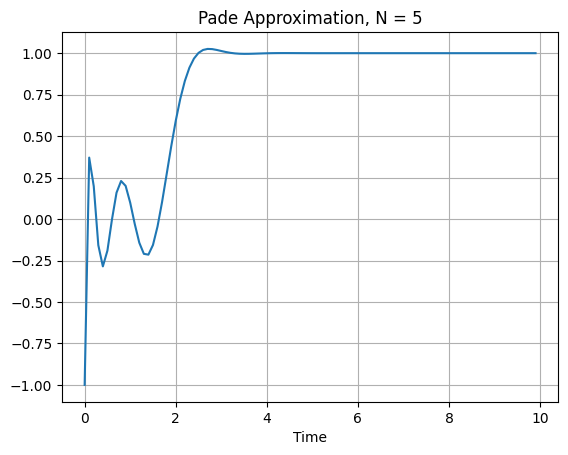

In [17]:
# Time delay
Tau = 2

# Approximation Order
N = 5
### If you want a more accurate approximation, you can increase the order N. However, Pade approximations with order N>10 should be avoided.

[num_pade, den_pade] = ct.pade(Tau, N)
Hpade = ct.tf(num_pade, den_pade)
print('Hpade = ', Hpade)


start = 0
stop = 10
step = 0.1

t = np.arange(start, stop, step)

t, y = ct.step_response(Hpade, t)

plt.plot(t,y)
title = "Pade Approximation, N = " + str(N)
plt.title(title)
plt.grid()
plt.xlabel('Time')

Hpade =  <TransferFunction>: sys[2]
Inputs (1): ['u[0]']
Outputs (1): ['y[0]']


-s + 1
------
s + 1



Text(0.5, 0, 'Time')

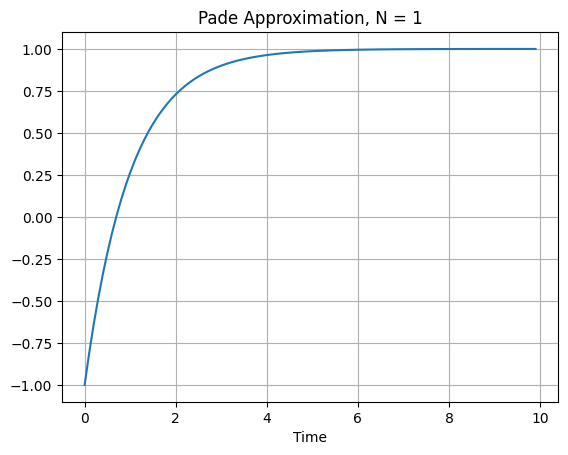

In [18]:
# Time delay
Tau = 2

# Approximation Order
N = 1 # For first order Pade approximation
### If you want a more accurate approximation, you can increase the order N. However, Pade approximations with order N>10 should be avoided.

[num_pade, den_pade] = ct.pade(Tau, N)
Hpade = ct.tf(num_pade, den_pade)
print('Hpade = ', Hpade)


start = 0
stop = 10
step = 0.1

t = np.arange(start, stop, step)

t, y = ct.step_response(Hpade, t)

plt.plot(t,y)
title = "Pade Approximation, N = " + str(N)
plt.title(title)
plt.grid()
plt.xlabel('Time')

Text(0.5, 0, 'Time')

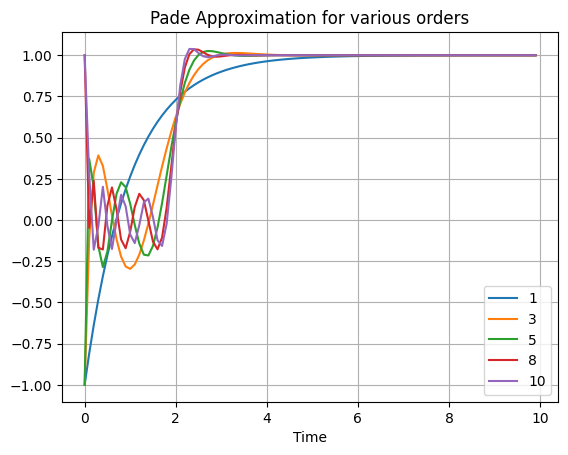

In [19]:
# Time delay
Tau = 2

# Approximation Order
N = [1,3,5,8,10]
### If you want a more accurate approximation, you can increase the order N. However, Pade approximations with order N>10 should be avoided.

start = 0
stop = 10
step = 0.1

t = np.arange(start, stop, step)

for n in N:
    [num_pade, den_pade] = ct.pade(Tau, n)
    Hpade = ct.tf(num_pade, den_pade)
    t, y = ct.step_response(Hpade, t)
    plt.plot(t,y)



plt.title("Pade Approximation for various orders")
plt.legend(N)
plt.grid()
plt.xlabel('Time')

#### First Order with Time Delay

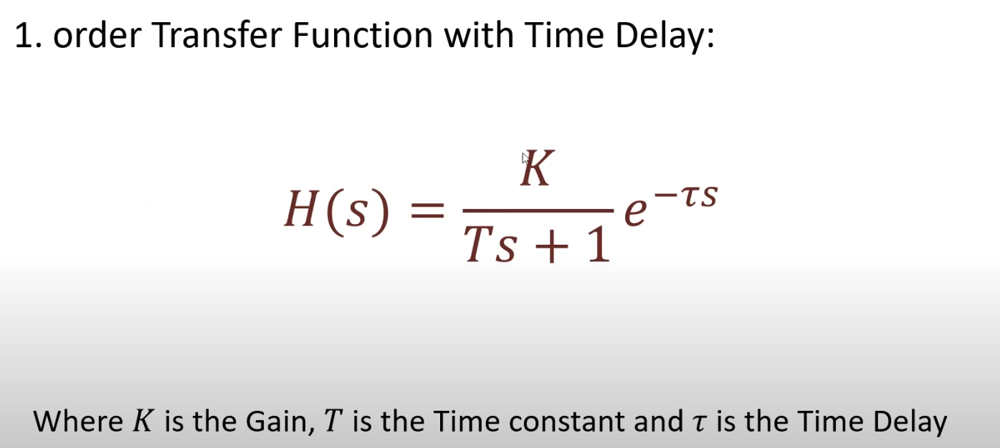

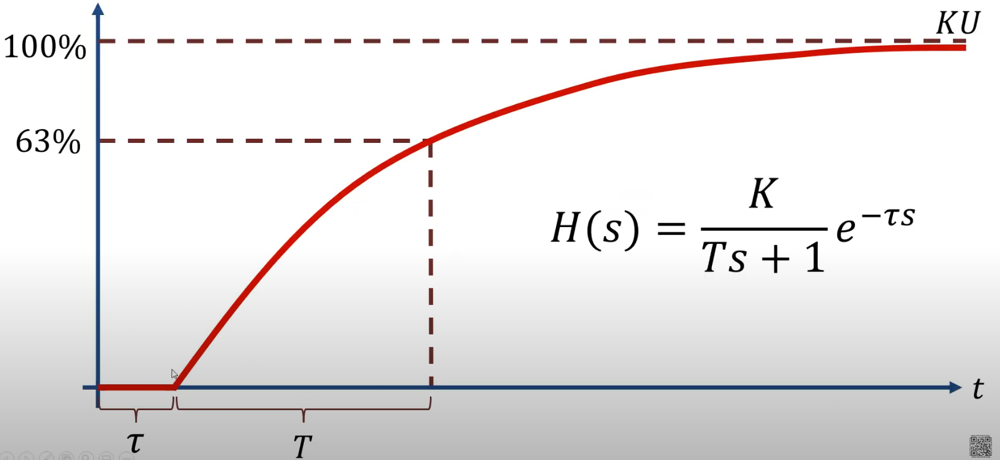

We'll understand this with the help of an example.

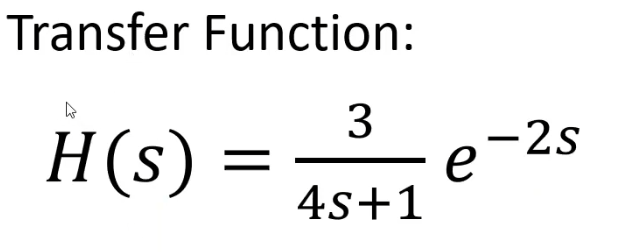

H1(s) =  <TransferFunction>: sys[14]
Inputs (1): ['u[0]']
Outputs (1): ['y[0]']


   3
-------
4 s + 1

H_pade(s) =  <TransferFunction>: sys[15]
Inputs (1): ['u[0]']
Outputs (1): ['y[0]']


s^6 - 21 s^5 + 210 s^4 - 1260 s^3 + 4725 s^2 - 1.04e+04 s + 1.04e+04
--------------------------------------------------------------------
s^6 + 21 s^5 + 210 s^4 + 1260 s^3 + 4725 s^2 + 1.04e+04 s + 1.04e+04

H(s) =  <TransferFunction>: sys[16]
Inputs (1): ['u[0]']
Outputs (1): ['y[0]']


       3 s^6 - 63 s^5 + 630 s^4 - 3780 s^3 + 1.418e+04 s^2 - 3.118e+04 s + 3.118e+04
-------------------------------------------------------------------------------------------
4 s^7 + 85 s^6 + 861 s^5 + 5250 s^4 + 2.016e+04 s^3 + 4.63e+04 s^2 + 5.198e+04 s + 1.04e+04



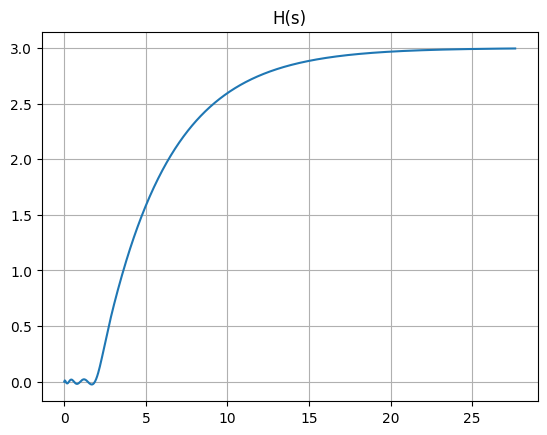

In [20]:
# for the first order transfer function
K = 3
T = 4

num = np.array([K])
den = np.array([T,1])

H1 = ct.tf(num, den)

print('H1(s) = ', H1)

# for time delay

Tau = 2 # Delay Time
N = 6 # Approximation Order

[num_pade, den_pade] = ct.pade(Tau, N)
H_pade = ct.tf(num_pade, den_pade)

print('H_pade(s) = ', H_pade)

H = ct.series(H1, H_pade) # basically, does H1 * H_pade

print('H(s) = ', H)

t, y = ct.step_response(H)

plt.plot(t, y)
plt.title('H(s)')
plt.grid()
plt.show()

### State Space Models

### Continous State Space Models

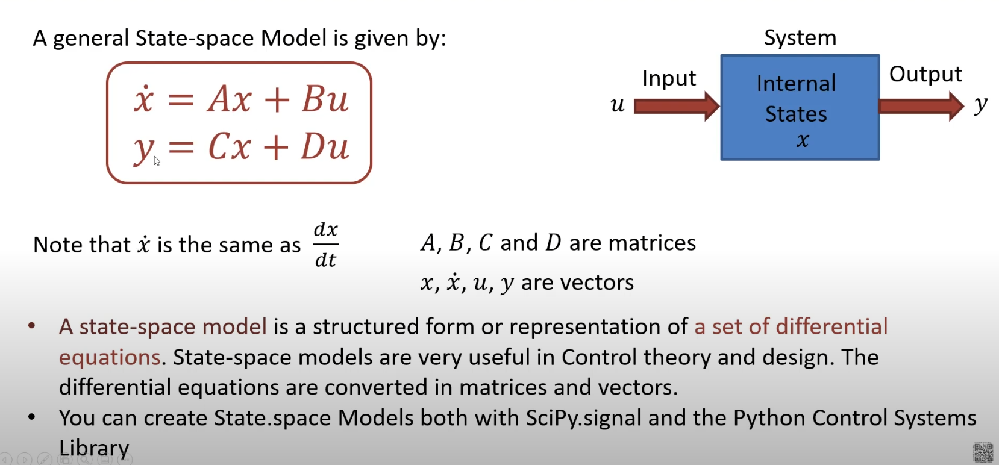

Applying State space model on the First Order dynamic system.

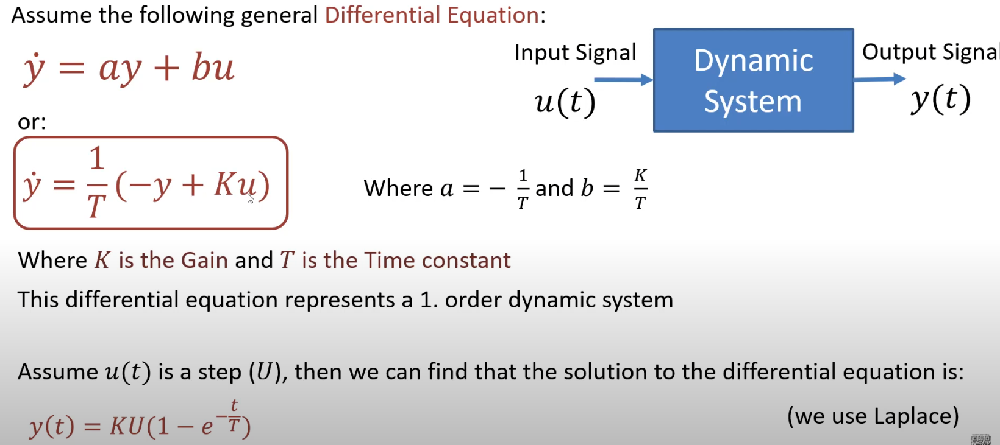

Approach to the solution:

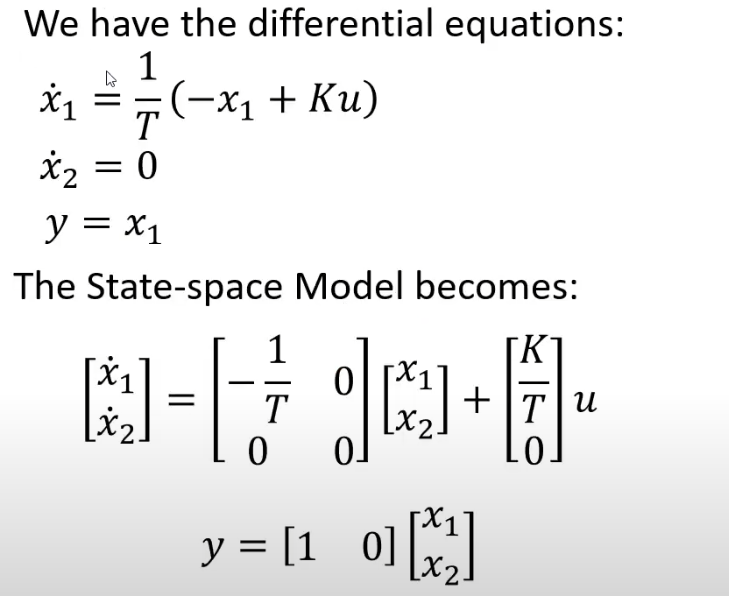


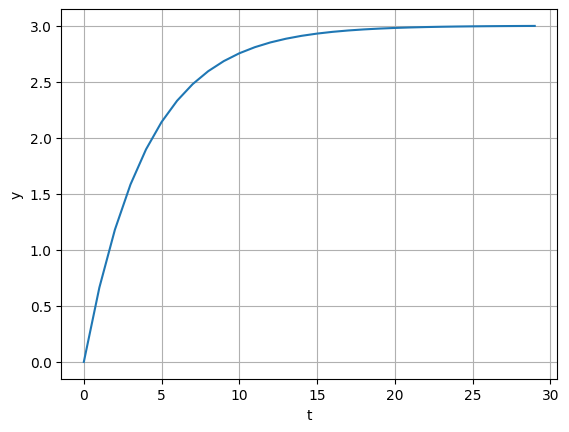

In [21]:
import scipy.signal as sig

# Simulation Parameters

x0 = [0,0]

start = 0
stop = 30
step = 1

t = np.arange(start, stop, step)

K = 3
T = 4

# State Space Model

A = [[-1/T, 0],
 [0,0]]
B = [[K/T], [0]]
C = [[1,0]]
D = 0

sys = sig.StateSpace(A, B, C, D)

# Simulation at step response

t, y = sig.step(sys, x0, t)

# Plotting
plt.plot(t,y)
plt.grid()
plt.xlabel('t')
plt.ylabel('y')
plt.show()


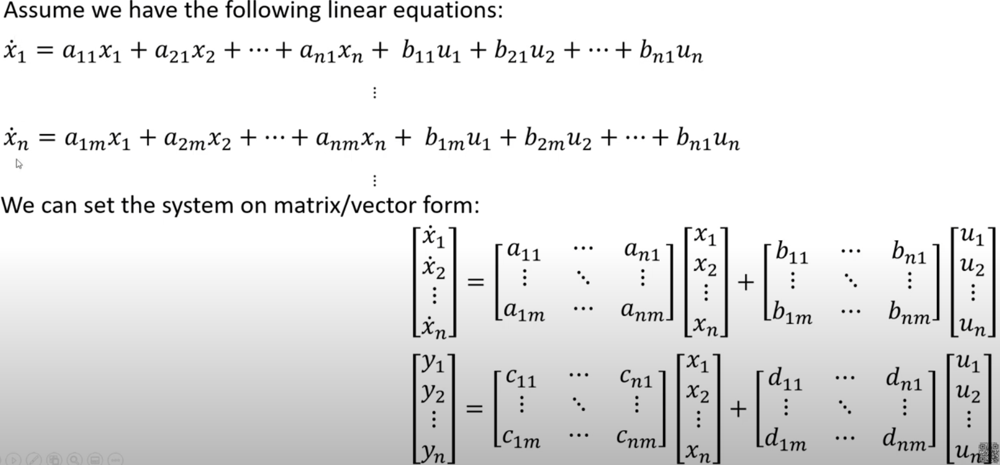

**BASIC EXAMPLE**

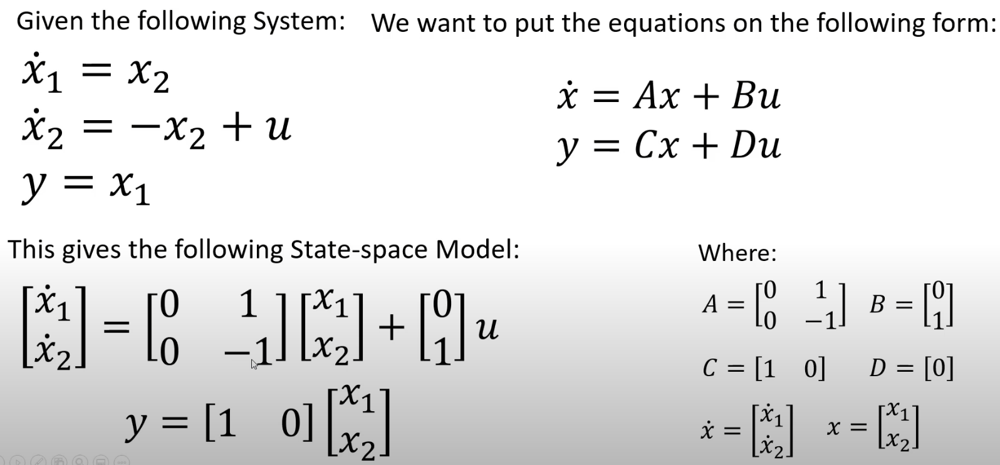

In [22]:
import scipy.signal as signal

A = [[0,1],
     [0,-1]]
B = [[0], [1]]
C = [[1,0]]
D = 0

sys = signal.StateSpace(A, B, C, D)
print(sys)

StateSpaceContinuous(
array([[ 0,  1],
       [ 0, -1]]),
array([[0],
       [1]]),
array([[1, 0]]),
array([[0]]),
dt: None
)


<StateSpace>: sys[19]
Inputs (1): ['u[0]']
Outputs (1): ['y[0]']
States (2): ['x[0]', 'x[1]']

A = [[ 0.  1.]
     [-1. -3.]]

B = [[1.]
     [0.]]

C = [[5. 6.]]

D = [[1.]]

[ 0.          0.18267412  0.36534824  0.54802237  0.73069649  0.91337061
  1.09604473  1.27871886  1.46139298  1.6440671   1.82674122  2.00941535
  2.19208947  2.37476359  2.55743771  2.74011183  2.92278596  3.10546008
  3.2881342   3.47080832  3.65348245  3.83615657  4.01883069  4.20150481
  4.38417893  4.56685306  4.74952718  4.9322013   5.11487542  5.29754955
  5.48022367  5.66289779  5.84557191  6.02824604  6.21092016  6.39359428
  6.5762684   6.75894252  6.94161665  7.12429077  7.30696489  7.48963901
  7.67231314  7.85498726  8.03766138  8.2203355   8.40300963  8.58568375
  8.76835787  8.95103199  9.13370611  9.31638024  9.49905436  9.68172848
  9.8644026  10.04707673 10.22975085 10.41242497 10.59509909 10.77777321
 10.96044734 11.14312146 11.32579558 11.5084697  11.69114383 11.87381795
 12.05649207 12.23916

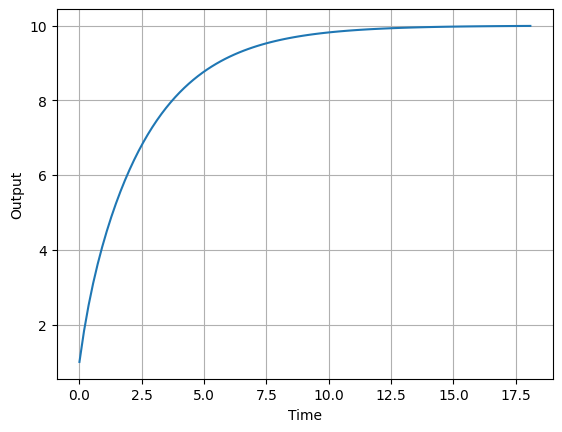

In [23]:
# Exmaple 2



A = [[0,1], [-1,-3]]
B = [[1], [0]]
C = [[5,6]]
D = [[1]]

ssmodel = ct.ss(A, B, C, D)

print(ssmodel)

t, y = ct.step_response(ssmodel)
print(t)
print(y)

plt.plot(t, y)
plt.xlabel('Time')
plt.ylabel('Output')
plt.grid()
plt.show()

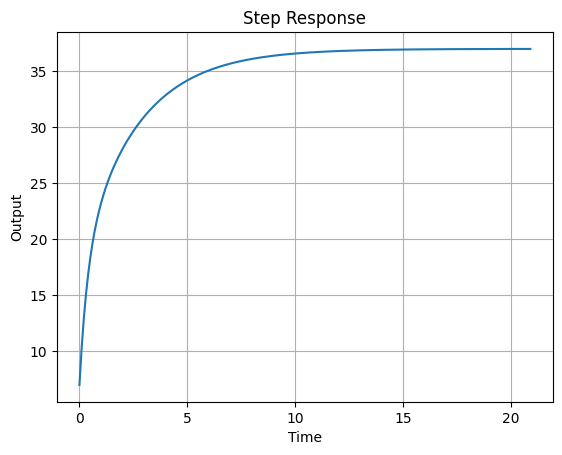

<Figure size 640x480 with 0 Axes>

In [24]:
# Example 3

# Define the State space models

A = [[0,1], [-1, -3]]
B = [[0,0], [2, 4]]
C = [[5,6]]
D = [[7,0]]

ssmodel = ct.ss(A,B,C,D)

# Step response for the system

start = 0
stop = 20
step = 0.1

t = np.arange(start, stop+1, step)

# Simulation Parameters

u = 1

t, y, x = ct.forced_response(ssmodel, t, u, return_x=True)

# Plot the results

y = y.flatten()

plt.plot(t, y)
plt.title("Step Response")
plt.xlabel('Time')
plt.ylabel('Output')
plt.grid()
plt.show()

plt.figure(2)
x1 = x[0, :]
x2 = x[1, :]


#### State Space models and Transfer Functions

There are 4 different type of systems:
1. **SIS0**: *single Input/ Single Output*
2. **MISO**: *Multiple Input/ Single output*
3. **SIMO**: *Single Input/Multiple output*
4. **MIMO**: *Multiple Input/ Multiple Output*

#### 1. SISO system

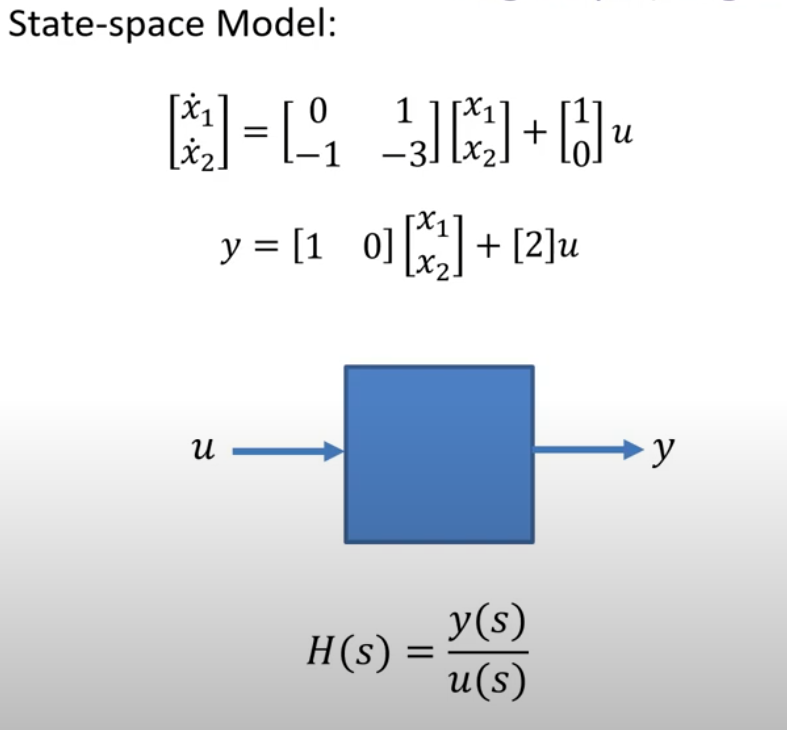

TransferFunctionContinuous(
array([2., 7., 5.]),
array([1., 3., 1.]),
dt: None
)


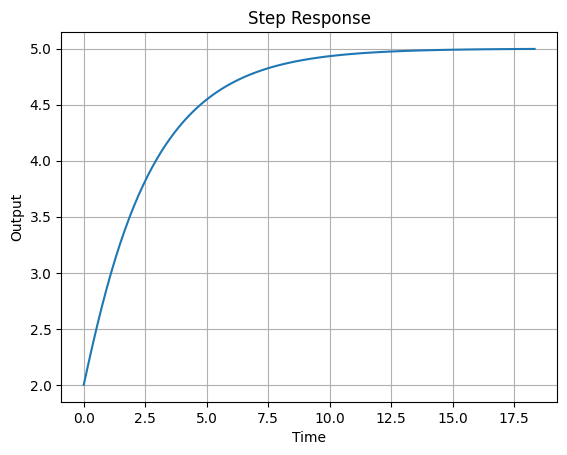

In [25]:
# SISO SYSTEM

# Defining the State Space Model

A = [[0,1], [-1,-3]]
B = [[1], [0]]
C = [[1,0]]
D = [[2]]

# Find the transfer function from u to y
num, den  = signal.ss2tf(A,B,C,D)
H = signal.TransferFunction(num,den)
print(H)

# Step Response for the system
t, y = signal.step(H)
plt.plot(t,y)
plt.xlabel('Time')
plt.ylabel('Output')
plt.title('Step Response')
plt.grid(True)
plt.show()


#### 2. MISO System

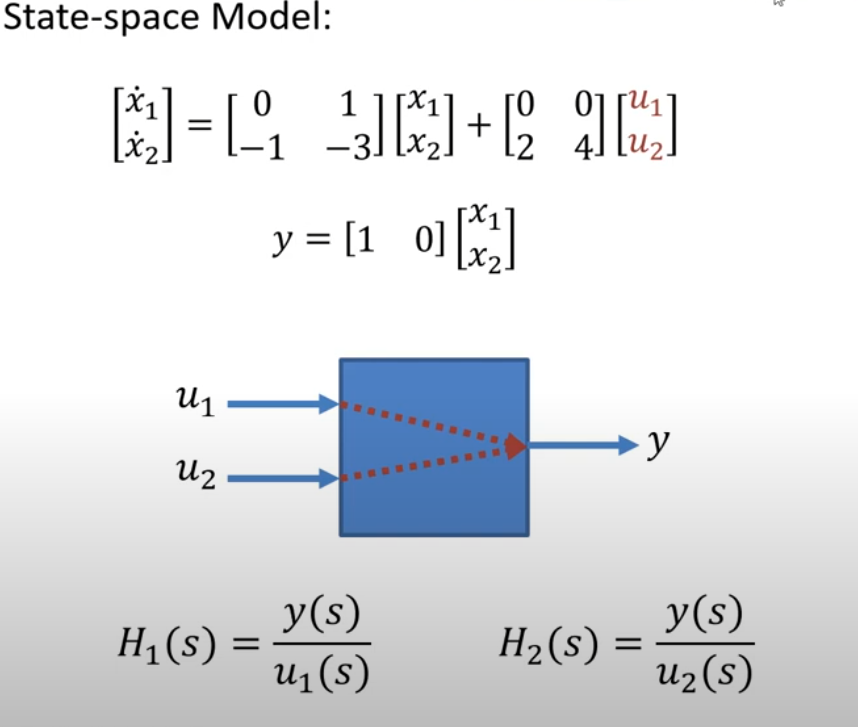

#### MISO SYSTEM
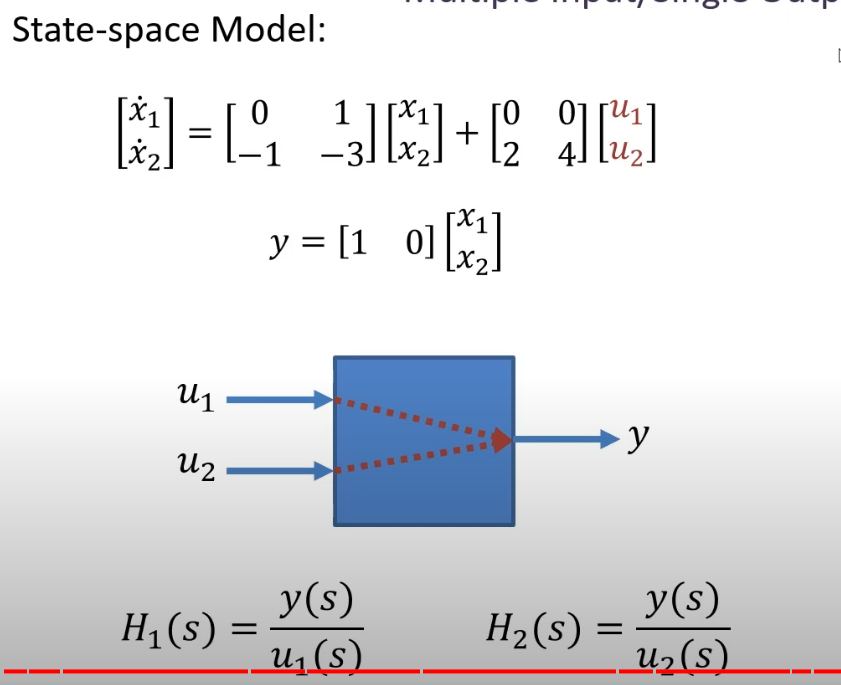

c:\Users\ashis\miniconda3\envs\minimal_ds\lib\site-packages\scipy\signal\_ltisys.py:599: BadCoefficients: Badly conditioned filter coefficients (numerator): the results may be meaningless
  self.num, self.den = normalize(*system)


TransferFunctionContinuous(
array([2.]),
array([1., 3., 1.]),
dt: None
)
TransferFunctionContinuous(
array([4.]),
array([1., 3., 1.]),
dt: None
)


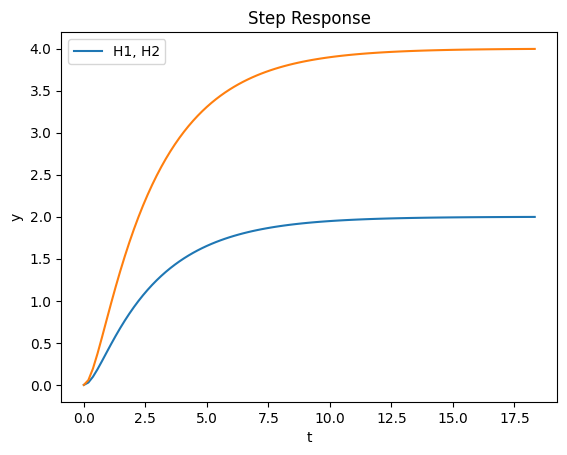

In [26]:
# MISO System

# Defining the State space model

A = [[0,1], [-1,-3]]
B = [[0,0], [2,4]]
C = [[1,0]]
D = [[0,0]]

# Find the transfer function from U1 to y
num, den  = signal.ss2tf(A,B,C,D, 0)
H1 = signal.TransferFunction(num,den)
print(H1)

# Find the transfer function from U2 to y
num, den  = signal.ss2tf(A,B,C,D, 1)
H2 = signal.TransferFunction(num,den)
print(H2)



# Step response of the system
t1, y1  = signal.step(H1)
plt.plot(t1, y1)

t2, y2 = signal.step(H2)
plt.plot(t2,y2)

plt.title("Step Response")
plt.xlabel("t")
plt.ylabel("y")
plt.legend(["H1, H2"])
plt.show()

#### SIMO SYSTEM
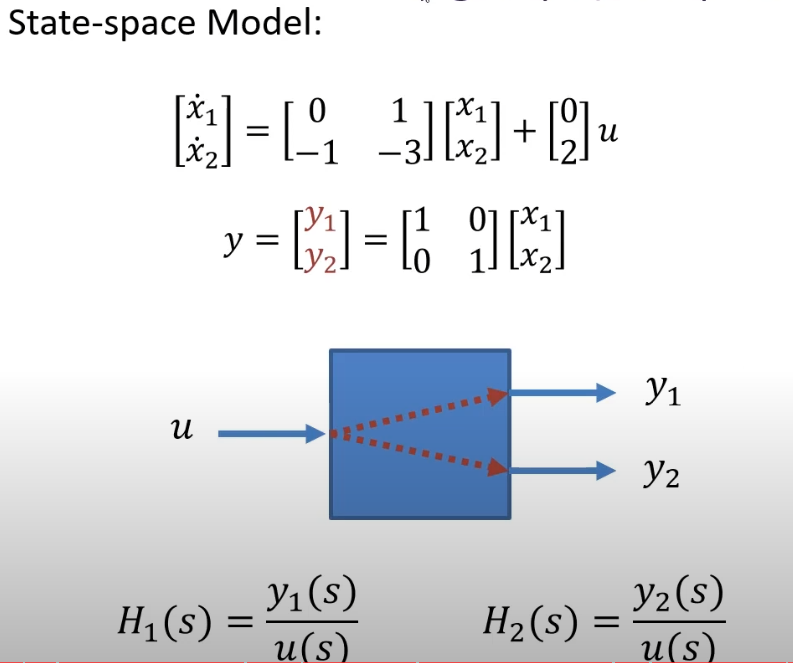

TransferFunctionContinuous(
array([2.]),
array([1., 3., 1.]),
dt: None
)
TransferFunctionContinuous(
array([ 2.00000000e+00, -1.55431223e-15]),
array([1., 3., 1.]),
dt: None
)


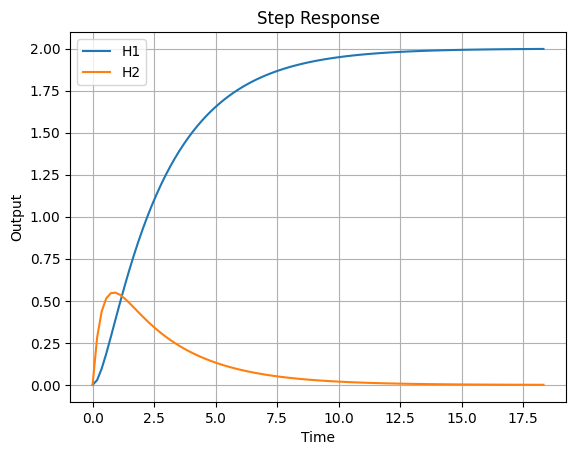

In [27]:
# SIMO SYSTEM

# Defining the model

A = [[0,1], [-1,-3]]
B = [[0], [2]]
C = [[1,0], [0,1]]
D = [[0]]

# Find the Transfer Function from u to y1
C = [[1, 0]]
num, den  = signal.ss2tf(A,B,C,D)
H1 = signal.TransferFunction(num, den)
print(H1)

# Find the transfer function from u to y2
C = [[0,1]]
num, den  = signal.ss2tf(A,B,C,D)
H2 = signal.TransferFunction(num, den)
print(H2)

# Step response for the system
t, y  = signal.step(H1)
plt.plot(t,y)

# Step response for the system
t, y  = signal.step(H2)
plt.plot(t,y)

plt.title("Step Response")
plt.xlabel("Time")
plt.ylabel("Output")
plt.grid(True)
plt.legend(["H1", "H2"])
plt.show()

#### MIMO SYSTEM
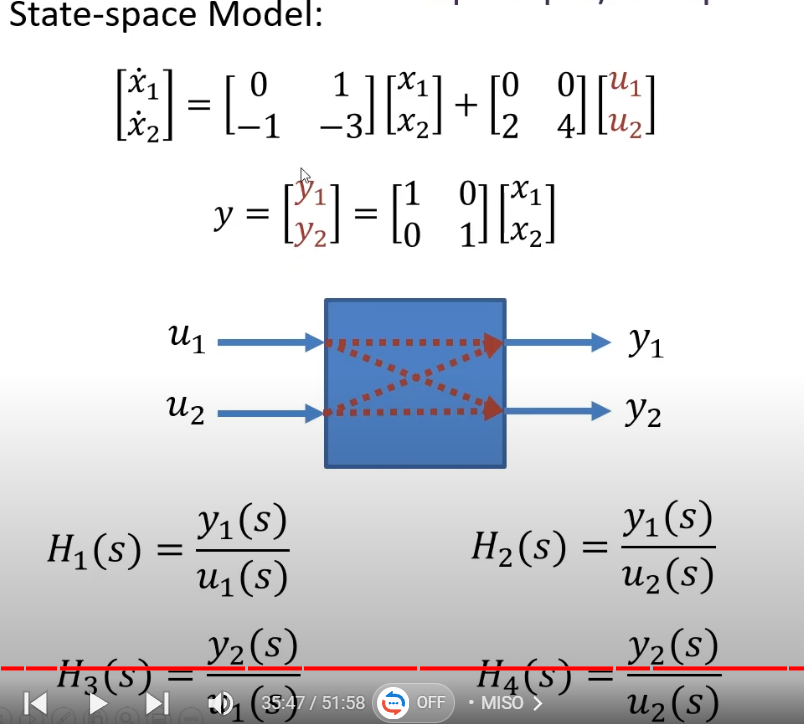

TransferFunctionContinuous(
array([2.]),
array([1., 3., 1.]),
dt: None
)
TransferFunctionContinuous(
array([4.]),
array([1., 3., 1.]),
dt: None
)
TransferFunctionContinuous(
array([ 2.00000000e+00, -1.55431223e-15]),
array([1., 3., 1.]),
dt: None
)
TransferFunctionContinuous(
array([ 4.00000000e+00, -9.99200722e-16]),
array([1., 3., 1.]),
dt: None
)


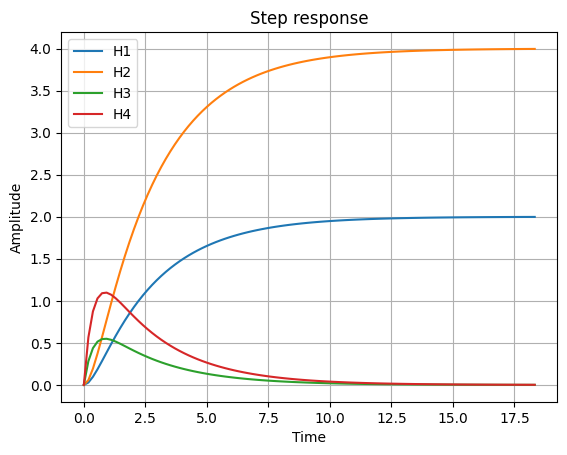

In [28]:
# MIMO SYSTEM

# Defining the State Space model
A = [[0,1], [-1,-3]]
B = [[0,0], [2,4]]
D = [[0,0]]

# For first set of soultions i.e. from u1 to y1, we are gonna use C as [[1,0]]
C = [[1,0]]
num, den  = signal.ss2tf(A,B,C,D,0)
H1 = signal.TransferFunction(num, den)
print(H1)

# For first set of soultions i.e. from u2 to y1, we are gonna use C as [[1,0]]
num, den  = signal.ss2tf(A,B,C,D,1)
H2 = signal.TransferFunction(num, den)
print(H2)

# For second set of soultions i.e. from u1 to y2, we are gonna use C as [[0,1]]
C = [[0,1]]
num, den  = signal.ss2tf(A,B,C,D,0)
H3 = signal.TransferFunction(num, den)
print(H3)

# For first set of soultions i.e. from u2 to y2, we are gonna use C as [[0,1]]
num, den  = signal.ss2tf(A,B,C,D,1)
H4 = signal.TransferFunction(num, den)
print(H4)

# Step resonse for the system
t, y = signal.step(H1)
plt.plot(t,y)
t, y = signal.step(H2)
plt.plot(t,y)
t, y = signal.step(H3)
plt.plot(t,y)
t, y = signal.step(H4)
plt.plot(t,y)

plt.title("Step response")
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.grid(True)
plt.legend(["H1", "H2", 'H3', 'H4'])
plt.show()




### Discrete State Space Models

Discretization methods
- Euler
    - Euler Forward Method
    - Euler Backward Method
- Zero Order Hold (ZOH)
- Tustin

#### 1. Euler Forward Method:
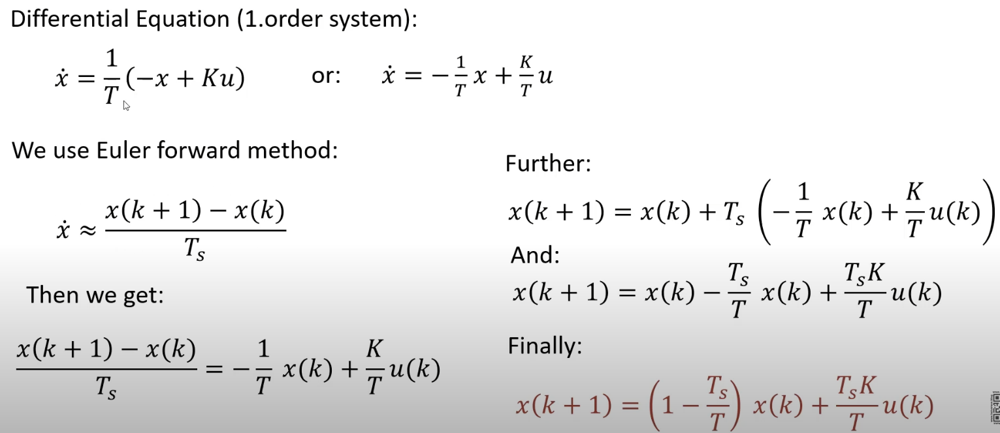

Let's start with an example

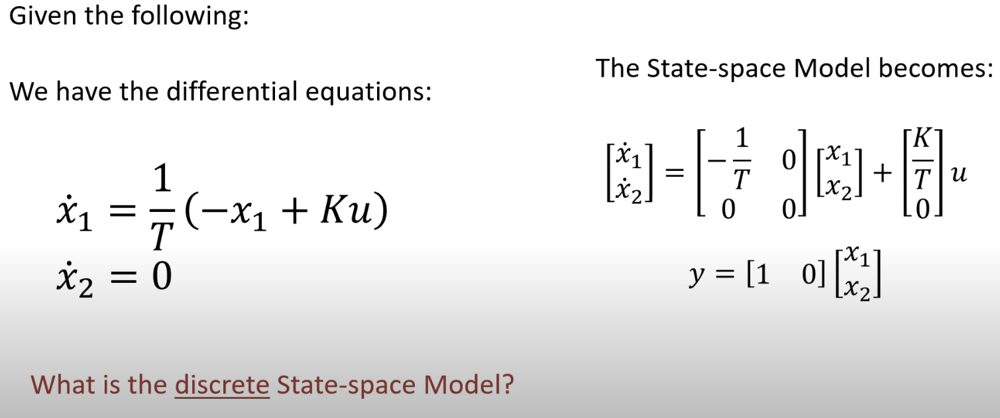

In [29]:
 ### Euler Forward Method
 K = 3
 T = 4

 # State space Model
A = [[-1/T, 0],[0,0]]
B = [[K/T], [0]]
C = [[1,0]]
D = 0

sys = signal.StateSpace(A,B,C,D)
print(sys)

# Discrete model
sys_discrete = sys.to_discrete(dt = 0.1, method='euler')
print(sys_discrete)

StateSpaceContinuous(
array([[-0.25,  0.  ],
       [ 0.  ,  0.  ]]),
array([[0.75],
       [0.  ]]),
array([[1, 0]]),
array([[0]]),
dt: None
)
StateSpaceDiscrete(
array([[0.975, 0.   ],
       [0.   , 1.   ]]),
array([[0.075],
       [0.   ]]),
array([[1., 0.]]),
array([[0.]]),
dt: 0.1
)


Let's build a more practical model

- Mass Spring Damper System with Python

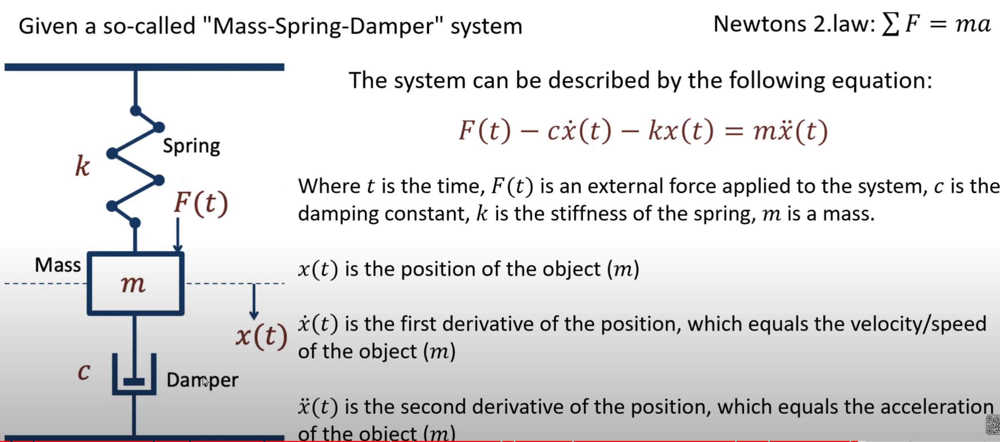

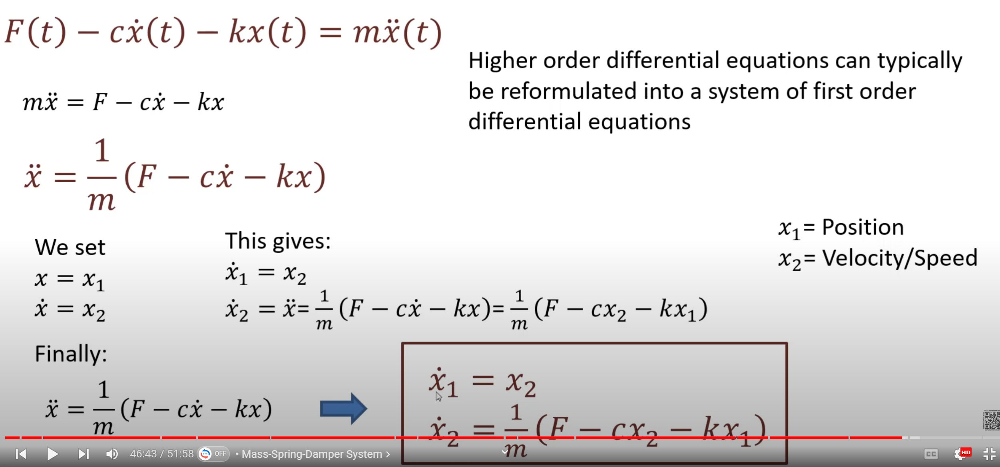

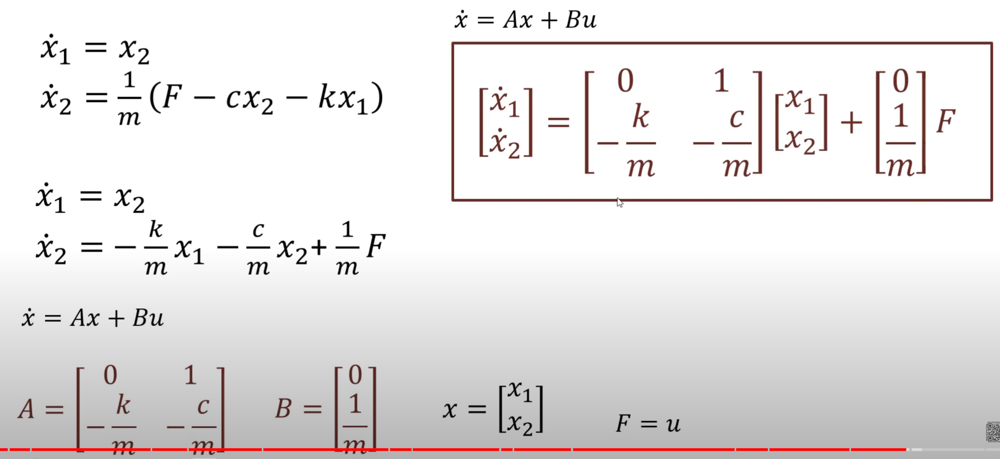

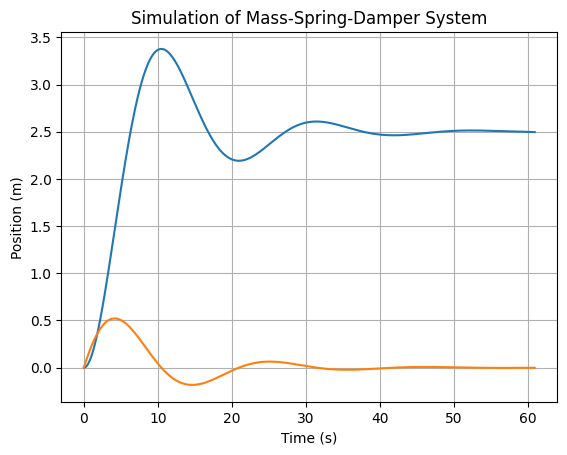

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

# Define system parameters
c = 4  # Damping coefficient
k = 2  # Stiffness of the spring
m = 20  # Mass of the system
F = 5  # Applied force
Ft = np.ones(610) * F  # Constant force over time

# Simulation parameters
tstart = 0
tstop = 60
step = 0.1

# Create time array
t = np.arange(tstart, tstop + 1, step)

# Define state space model matrices
A = [[0, 1], [-k / m, -c / m]]  # System dynamics
B = [[0], [1 / m]]  # Input matrix
C = [[1, 0]]  # Output matrix (position)
D = 0  # Feedthrough matrix (usually 0)

# Create state space system object
sys = signal.StateSpace(A, B, C, D)

# Simulate the system's response to the input force
t, y, x = signal.lsim(sys, Ft, t)

# Extract position and velocity from the state vector
x1 = x[:, 0]  # Position
x2 = x[:, 1]  # Velocity

# Plot the results
plt.plot(t, x1, t, x2)
plt.title("Simulation of Mass-Spring-Damper System")
plt.xlabel("Time (s)")
plt.ylabel("Position (m)")
plt.grid(True)
plt.show()
